<a href="https://colab.research.google.com/github/lookmeebbear/GeoAI_DOL/blob/main/GeoAI_DOL_Automatic_GeoSAM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Image Segmentation by Geospatial Segment Anything Model (GeoSAM)**


นำมาจาก Automatically generating object masks with SAM

Associate Professor Dr.Qiusheng Wu

https://samgeo.gishub.org/examples/automatic_mask_generator/


ลงเครื่องมือที่จำเป็น

In [ ]:
 %pip install segment-geospatial leafmap localtileserver

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.7/52.7 kB 1.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 39.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 54.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.0/96.0 kB 15.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.5/21.5 MB 75.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.2/40.2 kB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 97.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.6/108.6 kB 18.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 106.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 263.5/263.5 kB 36.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.8/52.8 kB 9.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
import os
from google.colab import files
import leafmap
from samgeo import SamGeo, show_image, download_file, overlay_images, tms_to_geotiff

นำเข้าข้อมูลภาพทางภูมิศาสตร์

In [ ]:
!wget https://theos2firstimage.gistda.or.th/myapp/static/media/06_Wat%20Arun%20Ratchawaram_2000.8260216cae417d012ba7.jpg

--2024-06-03 08:06:19--  https://theos2firstimage.gistda.or.th/myapp/static/media/06_Wat%20Arun%20Ratchawaram_2000.8260216cae417d012ba7.jpg
Resolving theos2firstimage.gistda.or.th (theos2firstimage.gistda.or.th)... 172.253.118.121, 2404:6800:4003:c01::79
Connecting to theos2firstimage.gistda.or.th (theos2firstimage.gistda.or.th)|172.253.118.121|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 6827666 (6.5M) [image/jpeg]
Saving to: ‘06_Wat Arun Ratchawaram_2000.8260216cae417d012ba7.jpg’

06_Wat Arun Ratchaw 100%[===================>]   6.51M  --.-KB/s    in 0.07s   

2024-06-03 08:06:20 (98.4 MB/s) - ‘06_Wat Arun Ratchawaram_2000.8260216cae417d012ba7.jpg’ saved [6827666/6827666]



นำเข้าโมเดลการสกัดวัตถุจากภาพ

In [ ]:
out_dir = os.path.join(os.path.expanduser("~"), "Downloads")
checkpoint = os.path.join(out_dir, "sam_vit_h_4b8939.pth")

In [ ]:
sam = SamGeo(
    model_type="vit_h",
    checkpoint=checkpoint,
    sam_kwargs=None,
)

Model checkpoint for vit_h not found.


Downloading...
From: https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
To: /root/.cache/torch/hub/checkpoints/sam_vit_h_4b8939.pth
100%|██████████| 2.56G/2.56G [00:17<00:00, 144MB/s]


In [ ]:
theos = '/content/06_Wat Arun Ratchawaram_2000.8260216cae417d012ba7.jpg'

In [ ]:
sam.generate(theos, output="GeoSAM_Theos2.tif", foreground=True, unique=True)

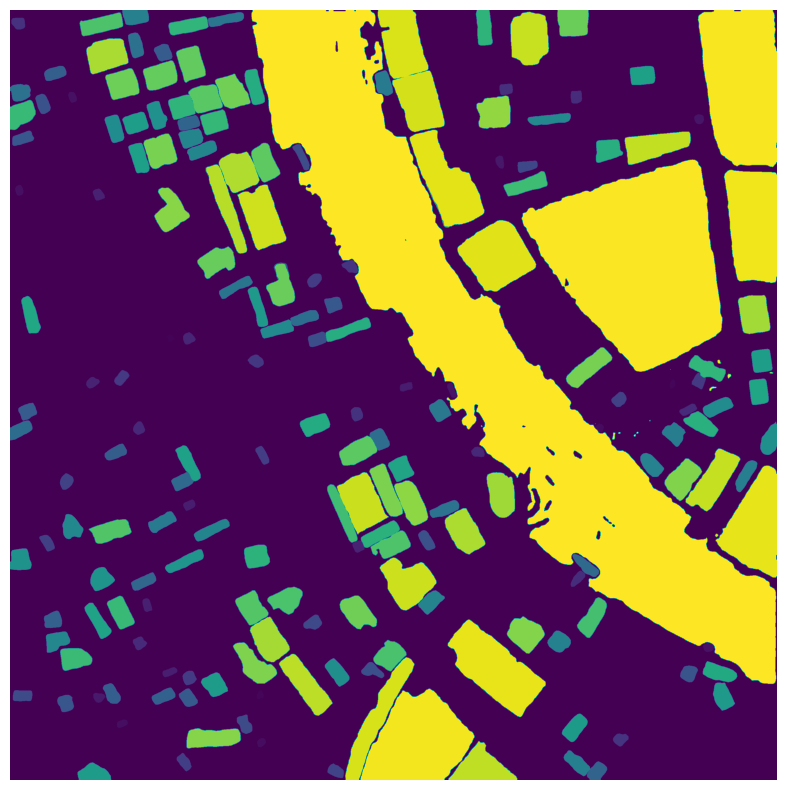

In [ ]:
sam.show_masks(cmap='viridis')

Show the object annotations (objects with random color) on the map.

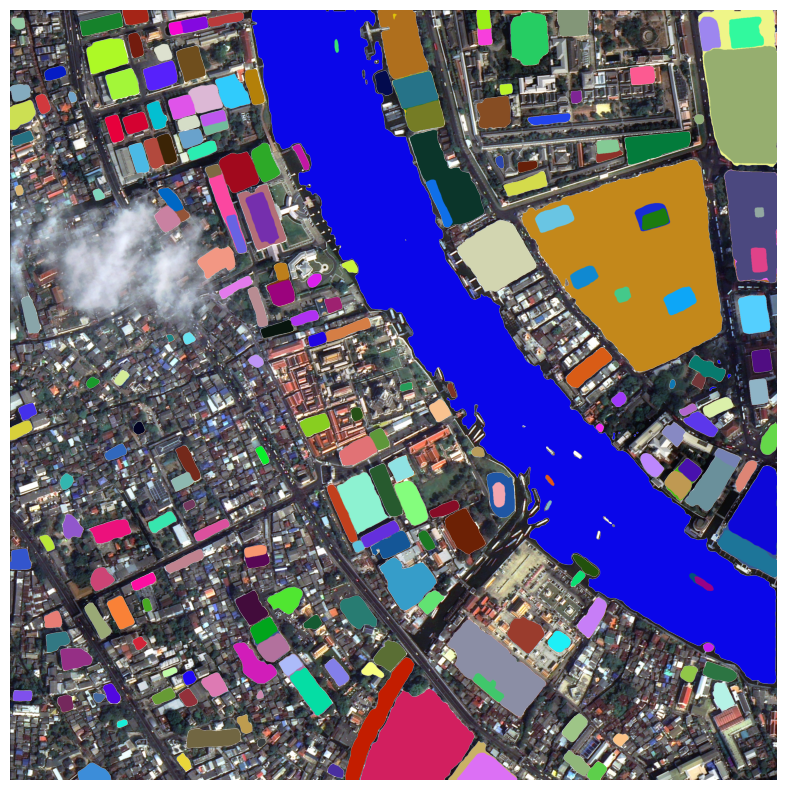

In [ ]:
sam.show_anns(axis="off", alpha=1, output="annotations.jpg")

Compare images with a slider.


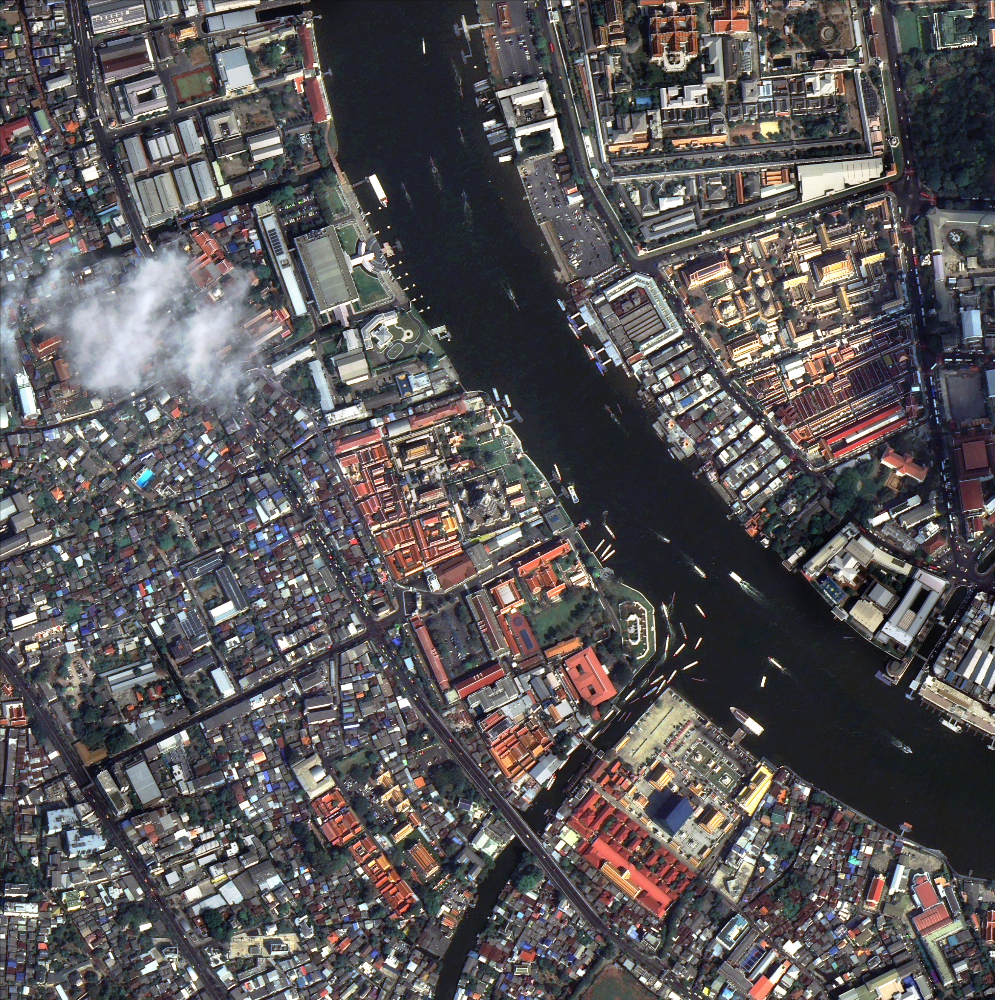
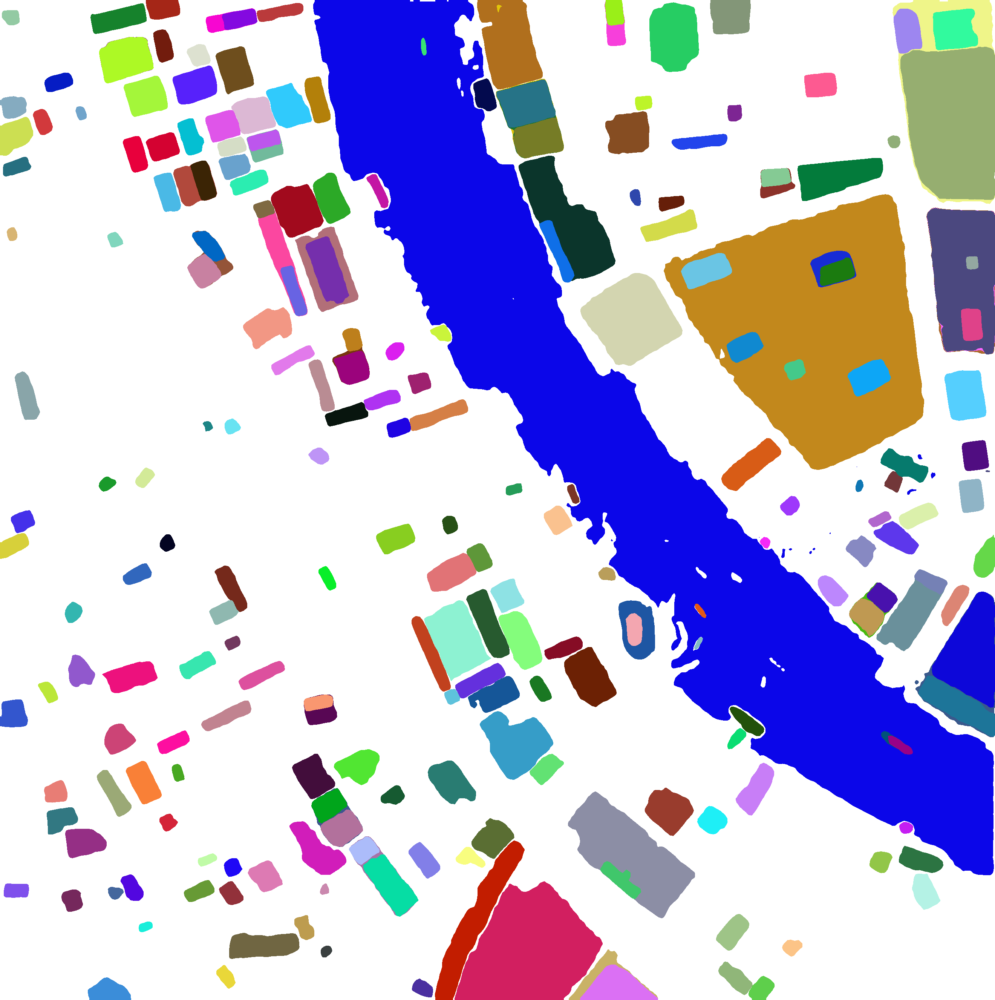

In [ ]:
leafmap.image_comparison(
    theos,
    "annotations.jpg",
    label1="THEOS-2",
    label2="Image Segmentation",
)

ลองปรับแต่งพารามิเตอร์หน่อย .... เตรียม RAM ให้พร้อม เหมาะกับ Colab Pro ....

In [ ]:
sam_kwargs = {
    "points_per_side": 32,
    "pred_iou_thresh": 0.86,
    "stability_score_thresh": 0.92,
    "crop_n_layers": 1,
    "crop_n_points_downscale_factor": 2,
    "min_mask_region_area": 100,
}

In [ ]:
sam = SamGeo(
    model_type="vit_h",
    checkpoint=checkpoint,
    sam_kwargs=sam_kwargs,
)

Model checkpoint for vit_h not found.


Downloading...
From: https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
To: /root/.cache/torch/hub/checkpoints/sam_vit_h_4b8939.pth
100%|██████████| 2.56G/2.56G [00:13<00:00, 192MB/s]


In [ ]:
theos = '/content/06_Wat Arun Ratchawaram_2000.8260216cae417d012ba7.jpg'

In [ ]:
sam.generate(theos, output="GeoSAM_Theos2_Adj.tif", foreground=True, unique=True)

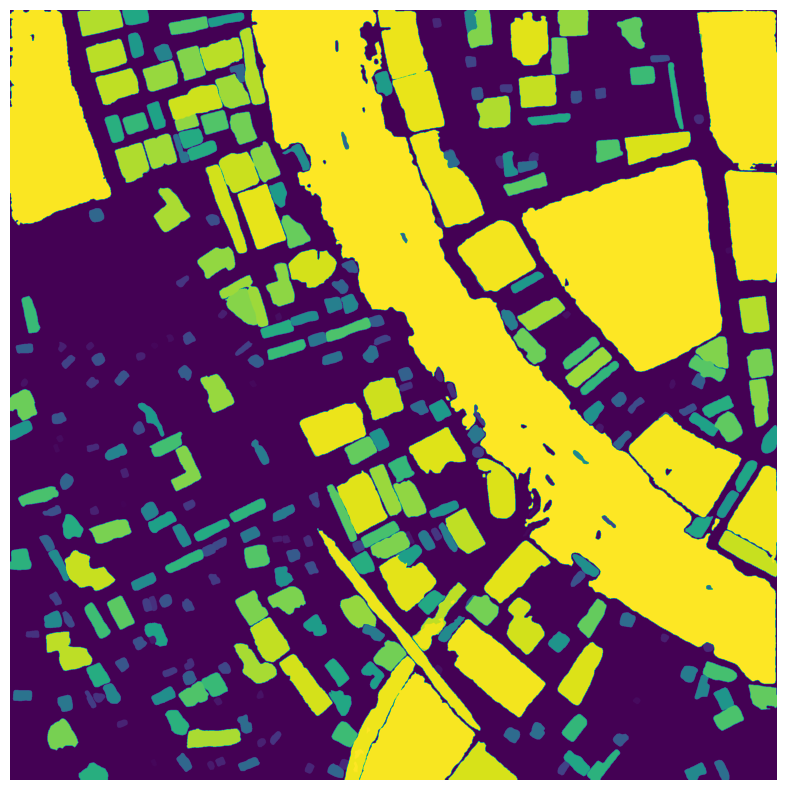

In [ ]:
sam.show_masks(cmap='viridis')

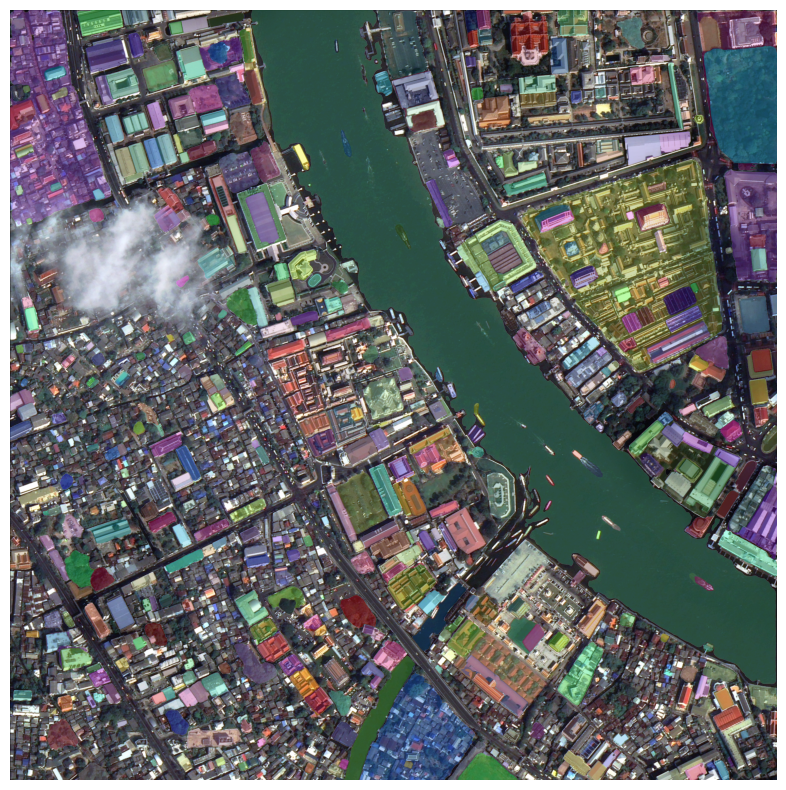

In [ ]:
sam.show_anns(axis="off", opacity=1, output="annotations2.tif")

Compare images with a slider.

In [ ]:
leafmap.image_comparison(
    theos,
    "annotations2.tif",
    label1="THEOS-2",
    label2="Image Segmentation",
)

Overlay the annotations on the image and use the slider to change the opacity interactively.

In [ ]:
sam.tiff_to_vector("masks2.tif", "planet_masks2.gpkg")

Download the results

In [ ]:
files.download("annotations.tif")
files.download("planet_mask.gpkg")
files.download("annotations2.tif")
files.download("planet_mask2.gpkg")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>